## Initial Steps

In order to perfom an accurate analyisis we will make some transformation and cleaning. We will add some columns with continent names and another column duration in minutes, besides, the column for artist names is crowded oftentimes with more artists, due to features. So, we want to get individual names.

We will check for null values and duplicate records as well. 

Each snippet is filled with annotations to follow along.

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.express as px
import plotly.graph_objects as go
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
!pip install pycountry
import pycountry as pc


In [2]:
pd.set_option('display.max_columns', None)

In [3]:
df= pd.read_csv(r'C:\Users\HP\Desktop\DA\Spotify dataset/universal_top_spotify_songs.csv')
df.head(5)

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,3CWq0pAKKTWb0K4yiglDc4,You’re Losing Me (From The Vault),Taylor Swift,1,49,49,NaN,2023-12-01,0,False,277831,You're Losing Me (From The Vault),2023-11-29,0.747,0.391,0,-13.767,1,0.0520,0.529,0.003000,0.1110,0.195,102.984,4
1,3rUGC1vUpkDG9CZFHMur1t,greedy,Tate McRae,2,-1,-1,NaN,2023-12-01,100,True,131872,greedy,2023-09-15,0.750,0.733,6,-3.180,0,0.0319,0.256,0.000000,0.1140,0.844,111.018,1
2,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,Taylor Swift,3,3,1,NaN,2023-12-01,98,False,178426,Lover,2019-08-23,0.552,0.702,9,-5.707,1,0.1570,0.117,0.000021,0.1050,0.564,169.994,4
3,0bYg9bo50gSsH3LtXe2SQn,All I Want for Christmas Is You,Mariah Carey,4,-2,7,NaN,2023-12-01,94,False,241106,Merry Christmas,1994-10-28,0.336,0.627,7,-7.463,1,0.0384,0.164,0.000000,0.0708,0.350,150.273,4
4,3vkCueOmm7xQDoJ17W1Pm3,My Love Mine All Mine,Mitski,5,-1,-2,NaN,2023-12-01,98,False,137773,The Land Is Inhospitable and So Are We,2023-09-15,0.504,0.308,9,-14.958,1,0.0321,0.868,0.135000,0.1580,0.121,113.950,4


In [4]:
# Checking for duplicate values
df[df.duplicated()].sum()

spotify_id            0.0
name                  0.0
artists               0.0
daily_rank            0.0
daily_movement        0.0
weekly_movement       0.0
country               0.0
snapshot_date         0.0
popularity            0.0
is_explicit           0.0
duration_ms           0.0
album_name            0.0
album_release_date    0.0
danceability          0.0
energy                0.0
key                   0.0
loudness              0.0
mode                  0.0
speechiness           0.0
acousticness          0.0
instrumentalness      0.0
liveness              0.0
valence               0.0
tempo                 0.0
time_signature        0.0
dtype: float64

In [5]:
# And null values
df.isna().sum()

spotify_id               0
name                    21
artists                 21
daily_rank               0
daily_movement           0
weekly_movement          0
country               2206
snapshot_date            0
popularity               0
is_explicit              0
duration_ms              0
album_name              33
album_release_date      33
danceability             0
energy                   0
key                      0
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness         0
liveness                 0
valence                  0
tempo                    0
time_signature           0
dtype: int64

In [6]:
# We can see there is one row with no song info
df[df['artists'].isnull()]

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
76445,7lyv2sysHCzFjypILxAynT,NaN,NaN,36,14,14,VE,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
76777,7lyv2sysHCzFjypILxAynT,NaN,NaN,18,32,32,SV,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
77314,7lyv2sysHCzFjypILxAynT,NaN,NaN,5,45,45,PE,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
77391,7lyv2sysHCzFjypILxAynT,NaN,NaN,32,18,18,PA,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
77605,7lyv2sysHCzFjypILxAynT,NaN,NaN,46,4,4,NI,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
78473,7lyv2sysHCzFjypILxAynT,NaN,NaN,25,25,25,HN,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
78577,7lyv2sysHCzFjypILxAynT,NaN,NaN,29,21,21,GT,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
78810,7lyv2sysHCzFjypILxAynT,NaN,NaN,12,38,38,ES,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
78965,7lyv2sysHCzFjypILxAynT,NaN,NaN,17,33,33,EC,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4
79219,7lyv2sysHCzFjypILxAynT,NaN,NaN,21,29,29,CR,2023-11-10,0,True,0,NaN,NaN,0.730,0.792,0,-4.643,1,0.0517,0.0232,0.000,0.0699,0.533,90.019,4


In [7]:
# Dropping that record
df.dropna(subset=['artists'], inplace=True)

In [8]:
# Now we want to replace True and False in the 'is_explicit' column for 1 and 0 values
def explicit(i):
    return(
    df.loc[:,'is_explicit']
    .replace(False, 0)
    .replace(True, 1)
    )
df = df.assign(is_explicit=explicit)
df.head()

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,3CWq0pAKKTWb0K4yiglDc4,You’re Losing Me (From The Vault),Taylor Swift,1,49,49,NaN,2023-12-01,0,0,277831,You're Losing Me (From The Vault),2023-11-29,0.747,0.391,0,-13.767,1,0.0520,0.529,0.003000,0.1110,0.195,102.984,4
1,3rUGC1vUpkDG9CZFHMur1t,greedy,Tate McRae,2,-1,-1,NaN,2023-12-01,100,1,131872,greedy,2023-09-15,0.750,0.733,6,-3.180,0,0.0319,0.256,0.000000,0.1140,0.844,111.018,1
2,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,Taylor Swift,3,3,1,NaN,2023-12-01,98,0,178426,Lover,2019-08-23,0.552,0.702,9,-5.707,1,0.1570,0.117,0.000021,0.1050,0.564,169.994,4
3,0bYg9bo50gSsH3LtXe2SQn,All I Want for Christmas Is You,Mariah Carey,4,-2,7,NaN,2023-12-01,94,0,241106,Merry Christmas,1994-10-28,0.336,0.627,7,-7.463,1,0.0384,0.164,0.000000,0.0708,0.350,150.273,4
4,3vkCueOmm7xQDoJ17W1Pm3,My Love Mine All Mine,Mitski,5,-1,-2,NaN,2023-12-01,98,0,137773,The Land Is Inhospitable and So Are We,2023-09-15,0.504,0.308,9,-14.958,1,0.0321,0.868,0.135000,0.1580,0.121,113.950,4


In [9]:
# Separating the 'artists' column into new columns to see the artists involved in the song
df2 = df['artists'].str.split(', ', expand=True)
df2.nunique()

0     1995
1     1134
2      434
3      138
4       58
5       29
6       10
7        6
8        5
9        4
10       3
11       1
12       1
13       1
14       1
15       1
16       1
17       1
18       1
19       1
20       1
21       1
22       1
23       1
24       1
25       1
dtype: int64

In [10]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 163762 entries, 0 to 163782
Data columns (total 26 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   0       163762 non-null  object
 1   1       64522 non-null   object
 2   2       19077 non-null   object
 3   3       4868 non-null    object
 4   4       2213 non-null    object
 5   5       1103 non-null    object
 6   6       452 non-null     object
 7   7       330 non-null     object
 8   8       158 non-null     object
 9   9       145 non-null     object
 10  10      142 non-null     object
 11  11      14 non-null      object
 12  12      14 non-null      object
 13  13      14 non-null      object
 14  14      14 non-null      object
 15  15      14 non-null      object
 16  16      14 non-null      object
 17  17      14 non-null      object
 18  18      14 non-null      object
 19  19      14 non-null      object
 20  20      14 non-null      object
 21  21      14 non-null      object
 

We can check that there are up to 11 artists in some songs, however, we will keep only 2 columns for the 'feat_artists', dividing them into 'feat_1' and 'feat_2'. 

In [11]:
df = pd.concat([df2, df], axis=1)
df.rename(columns = {0:'main_artist', 1:'feat_1', 2:'feat_2'}, inplace=True)
df.sample(5)

,main_artist,feat_1,feat_2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
44965,Ozuna,Feid,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,1zsPaEkglFvxjAhrM8yhpr,Hey Mor,"Ozuna, Feid",39,0,-2,PA,2023-11-19,87,0,196600,OzuTochi,2022-10-07,0.901,0.589,1,-6.713,0,0.2890,0.00302,0.000237,0.0992,0.399,98.002,4
146122,Doja Cat,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,56y1jOTK0XSvJzVv9vHQBK,Paint The Town Red,Doja Cat,9,-3,41,SK,2023-10-22,88,1,230480,Scarlet,2023-09-20,0.864,0.556,2,-7.683,0,0.1940,0.25500,0.000004,0.1120,0.726,99.974,4
26182,Harry Styles,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,4Dvkj6JhhA12EX05fT7y2e,As It Was,Harry Styles,40,-3,0,SG,2023-11-24,94,0,167303,Harry's House,2022-05-20,0.520,0.731,6,-5.338,0,0.0557,0.34200,0.001010,0.3110,0.662,173.930,4
11039,SZA,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,4iZ4pt7kvcaH6Yo8UoZ4s2,Snooze,SZA,40,10,-6,ZA,2023-11-28,92,1,201800,SOS,2022-12-09,0.559,0.551,5,-7.231,1,0.1320,0.14100,0.000000,0.1100,0.392,143.008,4
124435,Mora,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,0sfk352FO8bJUjWjIsyzSR,DONDE SE APRENDE A QUERER?,Mora,25,0,-1,PY,2023-10-28,87,0,144427,ESTRELLA,2023-08-28,0.722,0.519,8,-10.142,1,0.2970,0.55500,0.000000,0.1180,0.779,170.058,4


In [12]:
# We want to get rid of the remaining columns
df.drop(df.iloc[:, 3:27 ], axis=1, inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 163762 entries, 0 to 163782
Data columns (total 27 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   main_artist         163762 non-null  object 
 1   feat_1              64522 non-null   object 
 2   feat_2              19077 non-null   object 
 3   name                163762 non-null  object 
 4   artists             163762 non-null  object 
 5   daily_rank          163762 non-null  int64  
 6   daily_movement      163762 non-null  int64  
 7   weekly_movement     163762 non-null  int64  
 8   country             161556 non-null  object 
 9   snapshot_date       163762 non-null  object 
 10  popularity          163762 non-null  int64  
 11  is_explicit         163762 non-null  int64  
 12  duration_ms         163762 non-null  int64  
 13  album_name          163750 non-null  object 
 14  album_release_date  163750 non-null  object 
 15  danceability        163762 non-nul

In [13]:
# Changing data types for date columns
df['snapshot_date'] = pd.to_datetime(df['snapshot_date'])
df['album_release_date'] = pd.to_datetime(df['album_release_date'])

In [14]:
# Creating two new columns to get the release year and days since the album containing the song was also released
df['release_year'] = df['album_release_date'].dt.year
df['days_since_album_release'] = (df['snapshot_date'] - df['album_release_date']).dt.days

In [15]:
# Dropping the artists column, since we now have separated columns for the main artists and featured artists
df.drop(['artists'], axis=1, inplace= True)

In [16]:
# Creating a column with duration in minutes
df['duration_min']= round(df['duration_ms'] / (1000*60), 2)

In [17]:
# Now we want to replace the 'key' column with the actual key
def key_full(key):
    return(
    df.loc[:,'key']
    .replace(0, 'C')
    .replace(1, 'C#')
    .replace(2, 'D')
    .replace(3, 'Eb')
    .replace(4, 'E')
    .replace(5, 'F')
    .replace(6, 'F#')
    .replace(7, 'G')
    .replace(8, 'G#')
    .replace(9, 'A')
    .replace(10, 'Bb')
    .replace(11, 'B')
    )
df = df.assign(key = key_full)

In [18]:
# Creating a function to replace country codes with full country names with pycountry and 'Global' for records with null values,
# since these records are from the Global Top

def country_name(dataframe, col):

    
    for index, code in enumerate(dataframe[col]):
        if code:
            try:
                country = pc.countries.get(alpha_2=code)
                df.at[index, col]= country.name
            except AttributeError:
                pass
            except LookupError:
                df.at[index, col] = 'Global'
country_name(df, 'country')
df.sample(5)

,main_artist,feat_1,feat_2,name,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,release_year,days_since_album_release,duration_min
53513,Hassan El Shafei,Bosy,Double Zuksh,Mesh Shayfenhom ( Coke Studio Egypt 2023 ),46.0,3.0,-3.0,Egypt,2023-11-17,59.0,0.0,222760.0,Mesh Shayfenhom ( Coke Studio Egypt 2023 ),2023-08-03,0.741,0.905,G,-3.336,0.0,0.0442,0.1570,0.000001,0.189,0.668,124.008,4.0,2023.0,106.0,3.71
32199,iñigo quintero,None,None,Si No Estás,17.0,0.0,-3.0,Colombia,2023-11-23,99.0,0.0,184061.0,Si No Estás,2022-09-23,0.537,0.421,F,-8.720,1.0,0.0285,0.8270,0.000000,0.138,0.524,98.224,4.0,2022.0,426.0,3.07
150835,Heuss L'enfoiré,Gazo,None,Saiyan,22.0,0.0,28.0,Luxembourg,2023-10-21,76.0,1.0,189840.0,Chef D'orchestre,2023-06-30,0.775,0.808,G,-4.568,0.0,0.0353,0.3530,0.000042,0.207,0.638,125.013,4.0,2023.0,113.0,3.16
151750,Troye Sivan,None,None,One Of Your Girls,42.0,3.0,8.0,Spain,2023-10-21,80.0,0.0,181481.0,Something To Give Each Other,2023-10-13,0.629,0.654,B,-7.852,0.0,0.0584,0.0878,0.006550,0.220,0.799,93.034,4.0,2023.0,8.0,3.02
46896,GIMS,Morad,SativaMusic,SEYA,20.0,-6.0,0.0,Switzerland,2023-11-19,69.0,0.0,188484.0,LES DERNIÈRES VOLONTÉS DE MOZART (SYMPHONY),2023-10-05,0.798,0.681,Bb,-4.818,0.0,0.0722,0.2190,0.001970,0.137,0.434,101.005,4.0,2023.0,45.0,3.14


In [19]:
# Verifying the Global records

df.loc[df['country']=='Global']

,main_artist,feat_1,feat_2,name,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,release_year,days_since_album_release,duration_min
0,Taylor Swift,None,None,You’re Losing Me (From The Vault),1.0,49.0,49.0,Global,2023-12-01,0.0,0.0,277831.0,You're Losing Me (From The Vault),2023-11-29,0.747,0.391,C,-13.767,1.0,0.0520,0.5290,0.003000,0.1110,0.195,102.984,4.0,2023.0,2.0,4.63
1,Tate McRae,None,None,greedy,2.0,-1.0,-1.0,Global,2023-12-01,100.0,1.0,131872.0,greedy,2023-09-15,0.750,0.733,F#,-3.180,0.0,0.0319,0.2560,0.000000,0.1140,0.844,111.018,1.0,2023.0,77.0,2.20
2,Taylor Swift,None,None,Cruel Summer,3.0,3.0,1.0,Global,2023-12-01,98.0,0.0,178426.0,Lover,2019-08-23,0.552,0.702,A,-5.707,1.0,0.1570,0.1170,0.000021,0.1050,0.564,169.994,4.0,2019.0,1561.0,2.97
3,Mariah Carey,None,None,All I Want for Christmas Is You,4.0,-2.0,7.0,Global,2023-12-01,94.0,0.0,241106.0,Merry Christmas,1994-10-28,0.336,0.627,G,-7.463,1.0,0.0384,0.1640,0.000000,0.0708,0.350,150.273,4.0,1994.0,10626.0,4.02
4,Mitski,None,None,My Love Mine All Mine,5.0,-1.0,-2.0,Global,2023-12-01,98.0,0.0,137773.0,The Land Is Inhospitable and So Are We,2023-09-15,0.504,0.308,A,-14.958,1.0,0.0321,0.8680,0.135000,0.1580,0.121,113.950,4.0,2023.0,77.0,2.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160166,Maluma,Carin Leon,None,Según Quién,25.0,25.0,0.0,Global,2023-10-18,87.0,1.0,142334.0,Don Juan,2023-08-25,0.909,0.762,A,-3.974,1.0,0.0643,0.4340,0.000000,0.0856,0.843,101.987,3.0,2023.0,54.0,2.37
160167,Calle 24,Chino Pacas,Fuerza Regida,Que Onda,26.0,24.0,0.0,Global,2023-10-18,93.0,1.0,191466.0,Que Onda,2023-08-30,0.808,0.944,Bb,-4.863,0.0,0.0408,0.1830,0.000001,0.1380,0.937,124.934,3.0,2023.0,49.0,3.19
160168,Peso Pluma,Gabito Ballesteros,Junior H,LADY GAGA,27.0,23.0,0.0,Global,2023-10-18,95.0,1.0,212878.0,GÉNESIS,2023-06-29,0.646,0.736,F,-7.118,0.0,0.0449,0.2160,0.000000,0.4150,0.873,140.098,3.0,2023.0,111.0,3.55
160169,Harry Styles,None,None,As It Was,28.0,22.0,0.0,Global,2023-10-18,94.0,0.0,167303.0,Harry's House,2022-05-20,0.520,0.731,F#,-5.338,0.0,0.0557,0.3420,0.001010,0.3110,0.662,173.930,4.0,2022.0,516.0,2.79


In [20]:
df.isna().sum()

main_artist                     21
feat_1                       99261
feat_2                      144706
name                            21
daily_rank                      21
daily_movement                  21
weekly_movement                 21
country                          0
snapshot_date                   21
popularity                      21
is_explicit                     21
duration_ms                     21
album_name                      33
album_release_date              33
danceability                    21
energy                          21
key                             21
loudness                        21
mode                            21
speechiness                     21
acousticness                    21
instrumentalness                21
liveness                        21
valence                         21
tempo                           21
time_signature                  21
release_year                    33
days_since_album_release        33
duration_min        

In [21]:
df[df['main_artist'].isna()]

,main_artist,feat_1,feat_2,name,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,release_year,days_since_album_release,duration_min
76445,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Venezuela, Bolivarian Republic of",NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
76777,NaN,NaN,NaN,NaN,NaN,NaN,NaN,El Salvador,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
77314,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Peru,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
77391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Panama,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
77605,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Nigeria,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78473,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Honduras,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Guatemala,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78810,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Spain,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
78965,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ecuador,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
79219,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Costa Rica,NaT,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
df.dropna(subset=['main_artist'], inplace=True)

In [23]:
# Finally we don't have null values (except for the feat. columns, which is what we want)
df.isna().sum()

main_artist                      0
feat_1                       99240
feat_2                      144685
name                             0
daily_rank                       0
daily_movement                   0
weekly_movement                  0
country                          0
snapshot_date                    0
popularity                       0
is_explicit                      0
duration_ms                      0
album_name                      12
album_release_date              12
danceability                     0
energy                           0
key                              0
loudness                         0
mode                             0
speechiness                      0
acousticness                     0
instrumentalness                 0
liveness                         0
valence                          0
tempo                            0
time_signature                   0
release_year                    12
days_since_album_release        12
duration_min        

In [24]:
# Now, we want to create a column with continents based on country column
# First, we need to check every country
df['country'].unique()

array(['Global', 'South Africa', 'Viet Nam',
       'Venezuela, Bolivarian Republic of', 'Uruguay', 'United States',
       'Ukraine', 'Taiwan, Province of China', 'Turkey', 'Thailand',
       'El Salvador', 'Slovakia', 'Singapore', 'Sweden', 'Saudi Arabia',
       'Romania', 'Paraguay', 'Portugal', 'Poland', 'Pakistan',
       'Philippines', 'Peru', 'Panama', 'New Zealand', 'Norway',
       'Netherlands', 'Nicaragua', 'Nigeria', 'Malaysia', 'Mexico',
       'Morocco', 'Latvia', 'Luxembourg', 'Lithuania', 'Kazakhstan',
       'Korea, Republic of', 'Japan', 'Italy', 'Iceland', 'India',
       'Israel', 'Ireland', 'Indonesia', 'Hungary', 'Honduras',
       'Hong Kong', 'Guatemala', 'Greece', 'United Kingdom', 'France',
       'Finland', 'Spain', 'Egypt', 'Estonia', 'Ecuador',
       'Dominican Republic', 'Denmark', 'Germany', 'Czechia',
       'Costa Rica', 'Colombia', 'Chile', 'Switzerland', 'Canada',
       'Belarus', 'Brazil', 'Bolivia, Plurinational State of', 'Bulgaria',
       'Bel

In [25]:
# AE stands for United Arab Emirates according to its ISO code, so me make the replacement
df.loc[df['country']=='AE', 'country']='United Arab Emirates'

In [26]:
# Checking once more
df['country'].unique()

array(['Global', 'South Africa', 'Viet Nam',
       'Venezuela, Bolivarian Republic of', 'Uruguay', 'United States',
       'Ukraine', 'Taiwan, Province of China', 'Turkey', 'Thailand',
       'El Salvador', 'Slovakia', 'Singapore', 'Sweden', 'Saudi Arabia',
       'Romania', 'Paraguay', 'Portugal', 'Poland', 'Pakistan',
       'Philippines', 'Peru', 'Panama', 'New Zealand', 'Norway',
       'Netherlands', 'Nicaragua', 'Nigeria', 'Malaysia', 'Mexico',
       'Morocco', 'Latvia', 'Luxembourg', 'Lithuania', 'Kazakhstan',
       'Korea, Republic of', 'Japan', 'Italy', 'Iceland', 'India',
       'Israel', 'Ireland', 'Indonesia', 'Hungary', 'Honduras',
       'Hong Kong', 'Guatemala', 'Greece', 'United Kingdom', 'France',
       'Finland', 'Spain', 'Egypt', 'Estonia', 'Ecuador',
       'Dominican Republic', 'Denmark', 'Germany', 'Czechia',
       'Costa Rica', 'Colombia', 'Chile', 'Switzerland', 'Canada',
       'Belarus', 'Brazil', 'Bolivia, Plurinational State of', 'Bulgaria',
       'Bel

In [27]:
# Creating a dictionary with continents in key section and countries in value section
continents = {
    'North America': ['United States', 'Mexico' , 'Canada'],
    'Central America': ['Costa Rica', 'Dominican Republic', 'Guatemala', 'Honduras', 'Nicaragua', 'Panama', 'El Salvador'],
    'South America': ['Argentina', 'Bolivia, Plurinational State of', 'Brazil', 'Colombia', 'Chile', 'Ecuador', 'Paraguay',
                      'Peru', 'Uruguay', 'Venezuela, Bolivarian Republic of'],
    'Europe': ['Austria', 'Belgium', 'Bulgaria', 'Belarus', 'Switzerland', 'Czechia', 'Germany', 'Denmark', 'Estonia', 'Spain',
              'Finland', 'France', 'United Kingdom', 'Greece', 'Hungary', 'Ireland', 'Iceland', 'Italy', 'Lithuania', 'Luxembourg',
              'Latvia', 'Norway', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Sweden', 'Slovakia', 'Ukraine'],
    'Asia': ['United Arab Emirates', 'Egypt', 'Hong Kong', 'Israel', 'India', 'Indonesia', 'Japan', 'Korea, Republic of', 'Kazakhstan', 
             'Malaysia', 'Philippines', 'Pakistan', 'Saudi Arabia', 'Singapore', 'Thailand', 'Turkey', 'Taiwan, Province of China', 
             'Viet Nam'],
    'Africa': ['Morocco', 'Nigeria', 'South Africa'],
    'Oceania': ['Australia', 'New Zealand'],
    'Global': ['Global']
}  
sum(len(i) for i in continents.values())

73

In [28]:
# Creating a function to assing those values to a new column
def assign_continent(country):
    for continent, countries_in_continent in continents.items():
        if country in countries_in_continent:
            return continent

df['continent'] = df['country'].map(assign_continent)

In [29]:
df.sample(5)

,main_artist,feat_1,feat_2,name,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,release_year,days_since_album_release,duration_min,continent
13704,Bad Bunny,Bryant Myers,None,SEDA,12.0,-1.0,3.0,Dominican Republic,2023-11-28,88.0,1.0,190476.0,nadie sabe lo que va a pasar mañana,2023-10-13,0.706,0.566,F#,-6.441,0.0,0.1260,0.2680,0.000001,0.1110,0.230,125.876,4.0,2023.0,46.0,3.17,Central America
36174,Eslabon Armado,Peso Pluma,None,Ella Baila Sola,48.0,-5.0,-4.0,"Bolivia, Plurinational State of",2023-11-22,85.0,0.0,165671.0,DESVELADO,2023-04-28,0.668,0.758,F,-5.176,0.0,0.0332,0.4830,0.000019,0.0837,0.834,147.989,3.0,2023.0,208.0,2.76,South America
129070,The Kid LAROI,Jung Kook,Central Cee,TOO MUCH,3.0,0.0,47.0,"Korea, Republic of",2023-10-27,88.0,1.0,203894.0,TOO MUCH,2023-10-19,0.758,0.703,Bb,-5.979,0.0,0.1720,0.2520,0.000000,0.1460,0.465,94.985,4.0,2023.0,8.0,3.40,Asia
59828,Skryptonite,None,None,Это любовь,24.0,2.0,-1.0,Kazakhstan,2023-11-15,65.0,1.0,279250.0,Дом с нормальными явлениями,2015-01-01,0.358,0.416,C,-10.972,0.0,0.0596,0.3250,0.356000,0.1730,0.128,139.945,3.0,2015.0,3240.0,4.65,Asia
4611,Jung Kook,None,None,Standing Next to You,12.0,-1.0,-2.0,Pakistan,2023-11-30,97.0,0.0,206019.0,GOLDEN,2023-11-03,0.711,0.809,D,-4.389,0.0,0.0955,0.0447,0.000000,0.3390,0.816,106.017,4.0,2023.0,27.0,3.43,Asia


In [30]:
# We see the new column was successfully created
# Unfortunately we had to perform this process manually, since pycountry does not have an attribute to get continent names
df['continent'].value_counts()

Europe             64918
Asia               40478
South America      22502
Central America    15764
Africa              6718
North America       6667
Oceania             4509
Global              2206
Name: continent, dtype: int64

In [31]:
# Tempo in songs usually is made up of an integer so we round up tempo column
df['tempo'] = round(df['tempo'])

In [32]:
# Creating a column with the past week rank
df['past_week_rank'] = df['daily_rank'] + df['weekly_movement']

In [33]:
# Final check before EDA
df.sample(5)

,main_artist,feat_1,feat_2,name,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,release_year,days_since_album_release,duration_min,continent,past_week_rank
47136,Jungeli,Imen Es,Alonzo,Petit génie,10.0,1.0,2.0,Belgium,2023-11-19,68.0,1.0,217259.0,Petit génie,2023-08-04,0.794,0.578,C#,-5.932,0.0,0.2500,0.103,0.000012,0.3630,0.967,126.0,4.0,2023.0,107.0,3.62,Europe,12.0
15978,Lojay,Olamide,None,Arizona,36.0,-27.0,14.0,Nigeria,2023-11-27,50.0,1.0,139706.0,Arizona,2023-11-24,0.895,0.426,G,-7.454,1.0,0.0909,0.289,0.000010,0.0835,0.317,112.0,4.0,2023.0,3.0,2.33,Africa,50.0
46947,Toxi$,None,None,CRANKI,21.0,-1.0,29.0,Belarus,2023-11-19,62.0,0.0,110638.0,MIND UP!,2022-07-08,0.779,0.490,G#,-6.787,0.0,0.0629,0.121,0.000037,0.1120,0.399,141.0,4.0,2022.0,499.0,1.84,Europe,50.0
113622,Guzior,None,None,WTC,44.0,1.0,-4.0,Pakistan,2023-10-31,67.0,1.0,124000.0,PLEŚŃ,2020-12-04,0.671,0.662,F#,-7.189,0.0,0.1120,0.500,0.000000,0.1150,0.216,126.0,4.0,2020.0,1061.0,2.07,Asia,40.0
1856,Sfera Ebbasta,Lazza,Shiva,G63,7.0,-1.0,-3.0,Italy,2023-12-01,80.0,1.0,229253.0,X2VR,2023-11-17,0.754,0.699,A,-5.498,0.0,0.0684,0.275,0.000000,0.2210,0.330,134.0,4.0,2023.0,14.0,3.82,Europe,4.0


## Exploratory Data Analysis

In [34]:
df.shape

(163762, 31)

In [35]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
daily_rank,163762.0,25.466360,14.423566,1.000000,13.0000,25.000000,38.000000,50.000
daily_movement,163762.0,1.030789,7.393838,-46.000000,-1.0000,0.000000,2.000000,49.000
weekly_movement,163762.0,4.880192,14.181433,-46.000000,-3.0000,1.000000,8.000000,49.000
popularity,163762.0,77.528193,16.548431,0.000000,66.0000,82.000000,90.000000,100.000
is_explicit,163762.0,0.373145,0.483642,0.000000,0.0000,0.000000,1.000000,1.000
duration_ms,163762.0,194165.304601,48885.199114,34285.000000,162767.0000,187368.000000,220000.000000,641941.000
danceability,163762.0,0.686877,0.138235,0.159000,0.5930,0.706000,0.795000,0.982
energy,163762.0,0.644857,0.162651,0.012400,0.5410,0.666000,0.759000,0.997
loudness,163762.0,-6.637440,2.672955,-31.042000,-8.0670,-6.247000,-4.849000,1.155
mode,163762.0,0.508525,0.499929,0.000000,0.0000,1.000000,1.000000,1.000


In [36]:
df[(df['popularity']>0)].describe().T

,count,mean,std,min,25%,50%,75%,max
daily_rank,162394.0,25.476348,14.424112,1.000000,13.0000,25.000000,38.000000,50.000
daily_movement,162394.0,0.829723,6.961027,-46.000000,-1.0000,0.000000,2.000000,49.000
weekly_movement,162394.0,4.705747,14.051001,-46.000000,-3.0000,1.000000,8.000000,49.000
popularity,162394.0,78.181287,15.003248,1.000000,66.0000,82.000000,90.000000,100.000
is_explicit,162394.0,0.375020,0.484130,0.000000,0.0000,0.000000,1.000000,1.000
duration_ms,162394.0,194080.498972,48940.582892,34285.000000,162637.0000,187200.000000,219724.000000,641941.000
danceability,162394.0,0.687035,0.138392,0.159000,0.5930,0.706000,0.795000,0.982
energy,162394.0,0.644661,0.162640,0.012400,0.5410,0.666000,0.759000,0.997
loudness,162394.0,-6.637714,2.672958,-31.042000,-8.0670,-6.247000,-4.850000,1.155
mode,162394.0,0.506392,0.499961,0.000000,0.0000,1.000000,1.000000,1.000


We can see by these initial stats that there are records with 0 popularity and by filtering them out we get a mean of 78.6. However, there are records with 1 of popularity, so we will dig deeper into this parameter later

In [37]:
df.loc[df['days_since_album_release']==df['days_since_album_release'].max()]

,main_artist,feat_1,feat_2,name,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,duration_ms,album_name,album_release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,release_year,days_since_album_release,duration_min,continent,past_week_rank
283,Bing Crosby,Ken Darby Singers,John Scott Trotter & His Orchestra,White Christmas - 1947 Version,34.0,-10.0,-1.0,United States,2023-12-01,85.0,0.0,177480.0,Holiday Inn (Original Motion Picture Soundtrack),1942-01-01,0.317,0.158,A,-16.485,1.0,0.0381,0.673,0.353,0.338,0.247,131.0,3.0,1942.0,29919.0,2.96,North America,33.0


Also we notice the oldest song in many and even Global playlists is from 1962, with 22585 days since the album was released

In [38]:
df.loc[df['duration_min']==df['duration_min'].max()].groupby(['name', 'country', 'duration_min'])['name'].count()

name        country   duration_min
Let's Go 4  Brazil    10.7            45
            Poland    10.7             1
            Portugal  10.7            44
Name: name, dtype: int64

The longest song is 10.7 minutes and is present in Brazil and Portugal tops

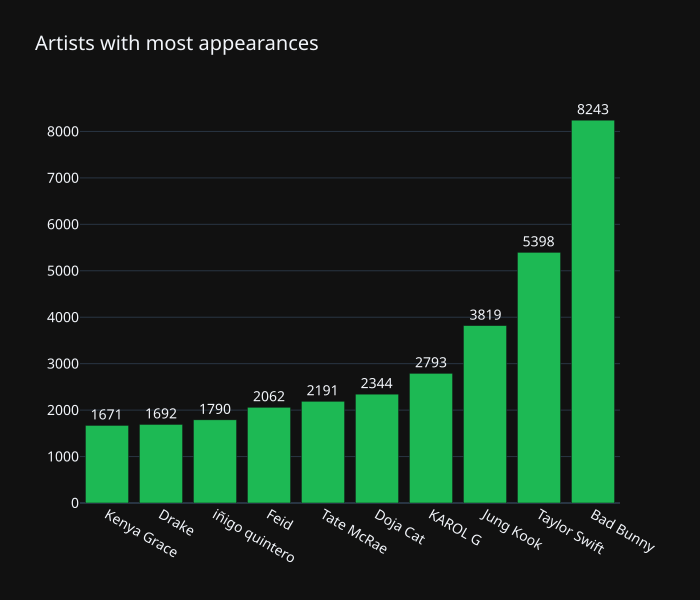

In [79]:
fig = px.bar(y= df['main_artist'].value_counts()[:10].sort_values(ascending=True).values, 
       x= df['main_artist'].value_counts()[:10].sort_values(ascending=True).index, 
       template= 'plotly_dark', 
       labels={'y': '', 'x': ''}, 
       height=600, text=df['main_artist'].value_counts()[:10].sort_values(ascending=True).values,
       color_discrete_sequence=['#1DB954'],
       title= 'Artists with most appearances'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic")).update_traces(textposition='outside')
fig.show('svg')

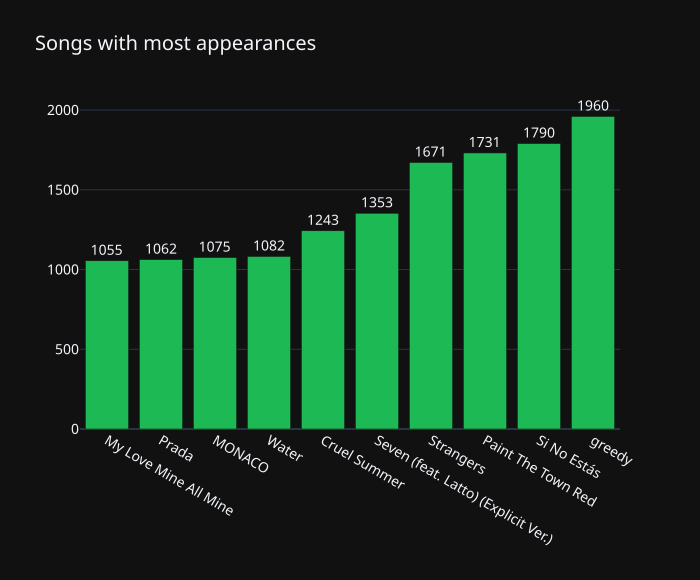

In [80]:
fig = px.bar(y= df['name'].value_counts()[:10].sort_values(ascending=True).values, 
       x= df['name'].value_counts()[:10].sort_values(ascending=True).index, 
       template= 'plotly_dark', 
       labels={'y': '', 'x': ''}, 
       height=580, text=df['name'].value_counts()[:10].sort_values(ascending=True).values,
       color_discrete_sequence=['#1DB954'],
       title= 'Songs with most appearances'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic")).update_traces(textposition='outside')
fig.show('svg')

In [41]:
most_feat_1= df['feat_1'].value_counts()
most_feat_2= df['feat_2'].value_counts()
total_feat= most_feat_1.add(most_feat_2, fill_value=0)
total_feat= total_feat.sort_values(ascending=False)[:10]
total_feat

Milo j            2217.0
Feid              2196.0
Young Miko        2083.0
Peso Pluma        1803.0
Latto             1357.0
Bad Bunny         1311.0
Carin Leon        1156.0
D-Block Europe    1062.0
RAYE              1062.0
Central Cee        971.0
dtype: float64

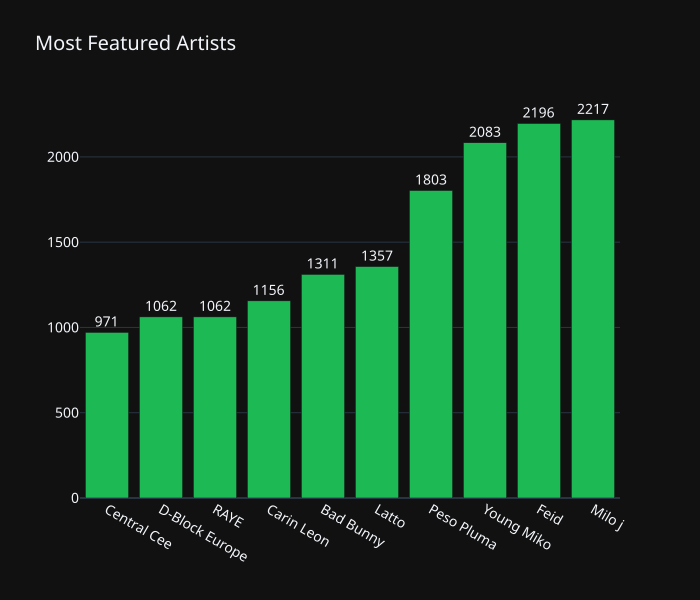

In [82]:
fig= px.bar(y= total_feat.sort_values(ascending=True).values, 
       x= total_feat.sort_values(ascending=True).index, 
       template= 'plotly_dark', 
       labels={'y': '', 'x': ''}, 
       height=600, text=total_feat.sort_values(ascending=True).values,
       color_discrete_sequence=['#1DB954'],
       title= 'Most Featured Artists'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic")).update_traces(textposition='outside')
fig.show('svg')

In [43]:
most_no1s = df[df['daily_rank']==1].groupby(['main_artist'])['daily_rank'].count().sort_values(ascending=False)[:10]
most_no1s

main_artist
Bad Bunny           439
iñigo quintero      304
Jung Kook           249
Kenya Grace         131
Maluma              117
AUR                  81
Jack Harlow          78
Tate McRae           77
Nadhif Basalamah     74
Taylor Swift         62
Name: daily_rank, dtype: int64

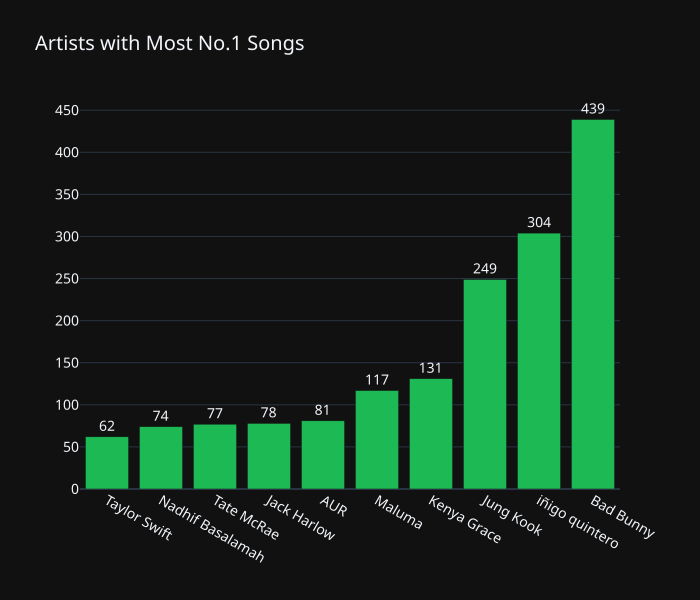

In [83]:
fig = px.bar(y= most_no1s.sort_values(ascending=True).values, 
       x= most_no1s.sort_values(ascending=True).index, 
       template= 'plotly_dark', 
       labels={'y': '', 'x': ''}, 
       height=600, text= most_no1s.sort_values(ascending=True).values,
       color_discrete_sequence=['#1DB954'],
       title= 'Artists with Most No.1 Songs'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic")).update_traces(textposition='outside')
fig.show('svg')

In [45]:
most_no1s_songs = df[df['daily_rank']==1].groupby(['name'])['daily_rank'].count().sort_values(ascending=False)[:10]
most_no1s_songs

name
PERRO NEGRO                            364
Si No Estás                            304
Seven (feat. Latto) (Explicit Ver.)    185
Strangers                              131
Según Quién                            117
Tu hai kahan                            81
Lovin On Me                             78
greedy                                  77
MONACO                                  75
penjaga hati                            74
Name: daily_rank, dtype: int64

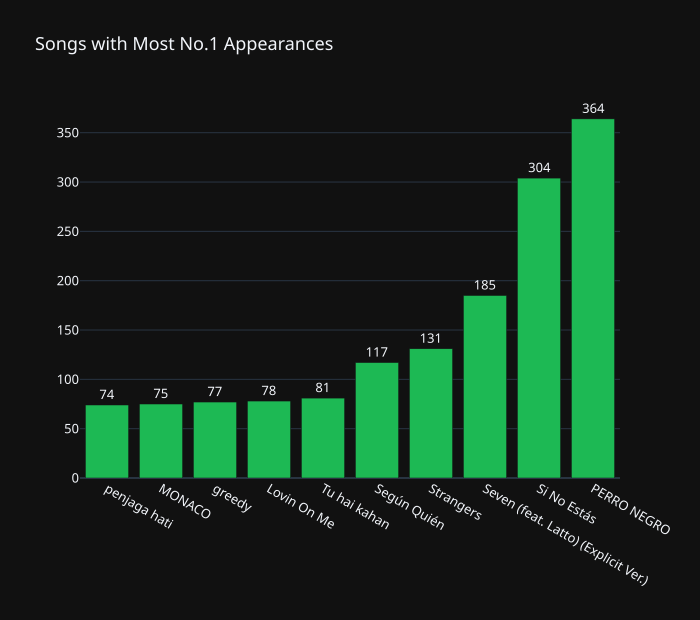

In [84]:
fig = px.bar(y= most_no1s_songs.sort_values(ascending=True).values, 
       x= most_no1s_songs.sort_values(ascending=True).index, 
       template= 'plotly_dark', 
       labels={'y': '', 'x': ''}, 
       height=620, text= most_no1s_songs.sort_values(ascending=True).values,
       color_discrete_sequence=['#1DB954'],
       title= 'Songs with Most No.1 Appearances'
      ).update_layout(
        font = dict(size=13,family="Franklin Gothic")).update_traces(textposition='outside')
fig.show('svg')

We will check some stats from artists with most appearances

In [47]:
artists = df['main_artist'].value_counts().nlargest(10).sort_values(ascending=True).index
df[(df['popularity']>0) & (df['main_artist'].isin(artists))].groupby(['main_artist'])[['daily_rank', 'popularity', 'days_since_album_release', 'duration_min']].agg([
    'mean', 'max', 'min', ('mode', lambda x: x.mode().iloc[0] if not x.mode().empty else None)])

daily_rank                  popularity                      \
                     mean   max  min  mode       mean    max   min   mode   
main_artist                                                                 
Bad Bunny       23.173359  50.0  1.0   1.0  89.890574   98.0  81.0   87.0   
Doja Cat        18.107082  50.0  1.0  11.0  86.648038   89.0  77.0   88.0   
Drake           26.033136  50.0  1.0  14.0  90.447337   94.0  67.0   94.0   
Feid            25.381183  50.0  4.0  17.0  87.262367   93.0  67.0   87.0   
Jung Kook       19.518220  50.0  1.0   1.0  89.609179   98.0  58.0   97.0   
KAROL G         22.878267  50.0  1.0   2.0  89.611171   94.0  77.0   90.0   
Kenya Grace     13.770197  50.0  1.0   1.0  97.705566   98.0  97.0   98.0   
Tate McRae      13.653126  50.0  1.0   2.0  97.325879  100.0  48.0  100.0   
Taylor Swift    26.731024  50.0  1.0  41.0  90.949113  100.0  73.0   99.0   
iñigo quintero  13.546927  50.0  1.0   1.0  98.222346   99.0  95.0   99.0   

               days_since_album_release                       duration_min  \
                                   mean     max    min   mode         mean   
main_artist                                                                  
Bad Bunny                     54.570302   574.0    5.0    5.0     3.681140   
Doja Cat                      49.333618    72.0   28.0   28.0     3.991681   
Drake                         63.586391  2765.0    3.0   12.0     4.230213   
Feid                         302.691562   443.0   19.0  423.0     2.999214   
Jung Kook                     35.685675  1236.0    2.0    3.0     3.137332   
KAROL G                      150.765843   280.0   69.0   88.0     2.840211   
Kenya Grace                   68.198085    91.0   47.0   47.0     2.880000   
Tate McRae                    49.872661    77.0    2.0   47.0     2.248498   
Taylor Swift                 761.862519  3311.0    2.0    4.0     3.421884   
iñigo quintero               411.084916   434.0  390.0  394.0     3.070000   

                                  
                 max   min  mode  
main_artist                       
Bad Bunny       6.32  2.06  4.45  
Doja Cat        4.42  3.84  3.84  
Drake           6.23  2.23  4.34  
Feid            3.80  2.60  3.27  
Jung Kook       4.00  2.44  3.36  
KAROL G         3.46  2.40  2.88  
Kenya Grace     2.88  2.88  2.88  
Tate McRae      2.66  2.20  2.20  
Taylor Swift    4.66  2.44  2.97  
iñigo quintero  3.07  3.07  3.07

Most Bad Bunny, Jung Kook, Kenya Grace and Iñigo Quintero songs are ranked 1.

Most Bad Bunny, ,Drake, Jung Kook, Tate McRae and Taylor Swift songs were released a few days ago.

Drake and Taylor Swift have songs way older than the other artists ranking in the tops.

Longest song released is 6.32.

There is preference for songs no longer than 4 minutes.

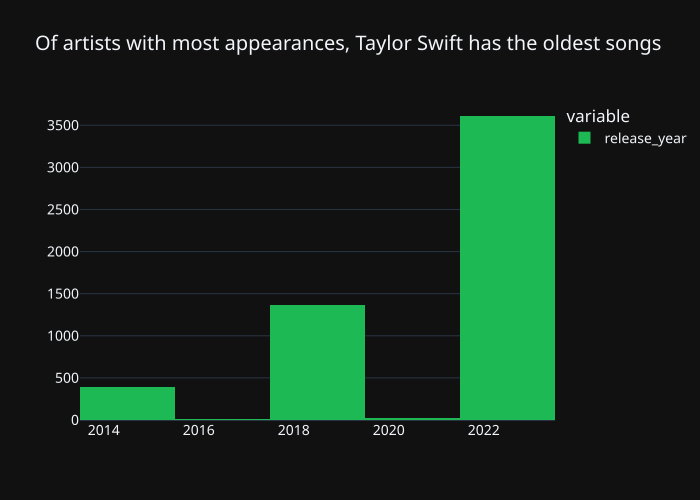

In [85]:
ts= df.loc[(df['main_artist']=='Taylor Swift')]
fig= px.histogram(ts['release_year'], nbins=6, template='plotly_dark', color_discrete_sequence=['#1DB954'],
            title='Of artists with most appearances, Taylor Swift has the oldest songs')
fig.update_layout(font = dict(size=14,family="Franklin Gothic"))
fig.update_xaxes(title_text='')
fig.update_yaxes(title_text='')
fig.show('svg')

Now we want to see if there are any artists that appear in every continent playlist

In [49]:
unique_artists= df['main_artist'].unique()
appearances_by_continent= {}
number_of_continents= len(df['continent'].unique())
for artist in unique_artists:
    sub_df= df[df['main_artist']==artist]
    sub_continents= sub_df['continent'].unique()
    if len(sub_continents)==number_of_continents:
        for continent in sub_continents:
            if artist not in appearances_by_continent:
                appearances_by_continent[artist]={}
            appearances_by_continent[artist][continent]=len(sub_df[sub_df['continent']==continent])

In [50]:
artists_in_every_continent= pd.DataFrame(appearances_by_continent).reset_index().rename(columns={'index': 'continent'})
artists_in_every_continent= artists_in_every_continent.drop(6)
artists_in_every_continent

,continent,Taylor Swift,Mariah Carey,Mitski,Jung Kook,Doja Cat,Bad Bunny,KAROL G,Dua Lipa,Olivia Rodrigo,David Kushner,Lord Huron,Billie Eilish,Peso Pluma,Drake,Darell,Feid,The Kid LAROI,Troye Sivan,The Beatles
0,Global,343,18,43,137,79,115,43,49,66,54,21,39,38,63,27,2,14,4,2
1,Africa,86,4,1,97,86,221,40,17,5,8,5,16,113,132,17,21,6,7,4
2,South America,216,4,18,340,48,2429,1325,24,9,3,20,29,246,57,392,1098,1,21,1
3,North America,640,54,103,72,171,270,88,59,139,34,15,52,228,334,3,31,7,19,3
4,Asia,1380,25,367,2259,617,275,59,169,154,86,38,154,17,205,17,66,183,66,1
5,Europe,2096,450,421,675,1150,938,263,838,588,746,316,393,79,681,68,124,64,241,74
7,Central America,123,7,6,213,15,3882,945,20,10,38,11,12,368,59,238,695,9,9,3


In [51]:
artists_with_most_appearances = artists_in_every_continent.iloc[:,1:].sum(axis=0)
artists_with_most_appearances = list(artists_with_most_appearances.nlargest(5).index)
artists_with_most_appearances

['Bad Bunny', 'Taylor Swift', 'Jung Kook', 'KAROL G', 'Doja Cat']

We will select artists with most appearances in every continent.

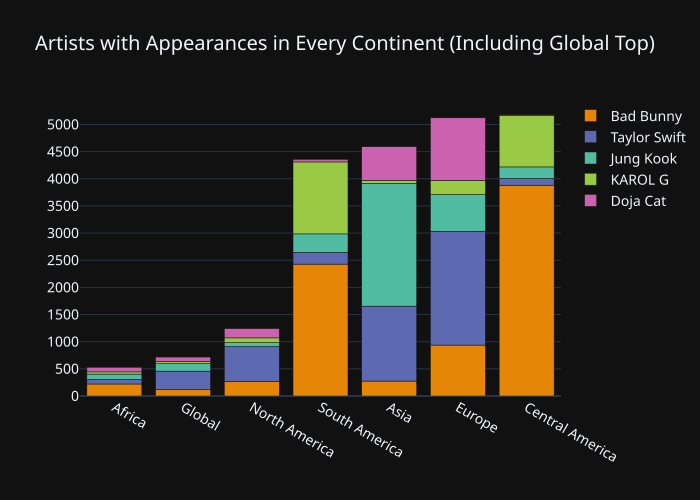

In [86]:
fig= px.bar(artists_in_every_continent, x='continent', y=artists_with_most_appearances,
               template='plotly_dark', color_discrete_sequence= px.colors.qualitative.Vivid, height=500,
                title='Artists with Appearances in Every Continent (Including Global Top)')

fig.update_yaxes(dtick=500, title_text='')
fig.update_xaxes(title_text='', categoryorder='total ascending')
fig.update_layout(legend_title_text='', font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

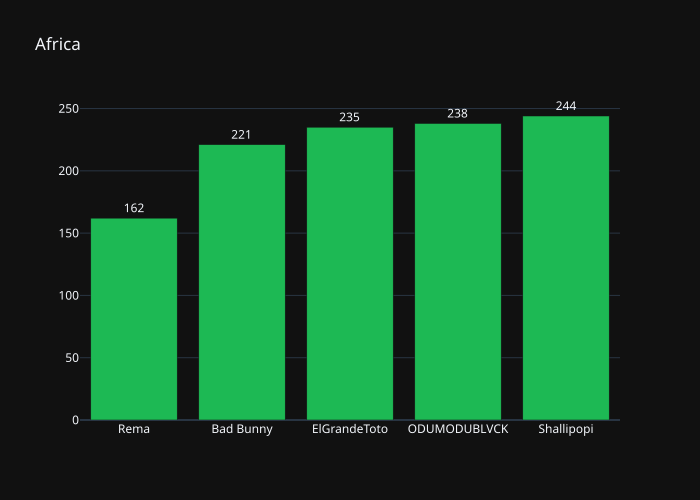

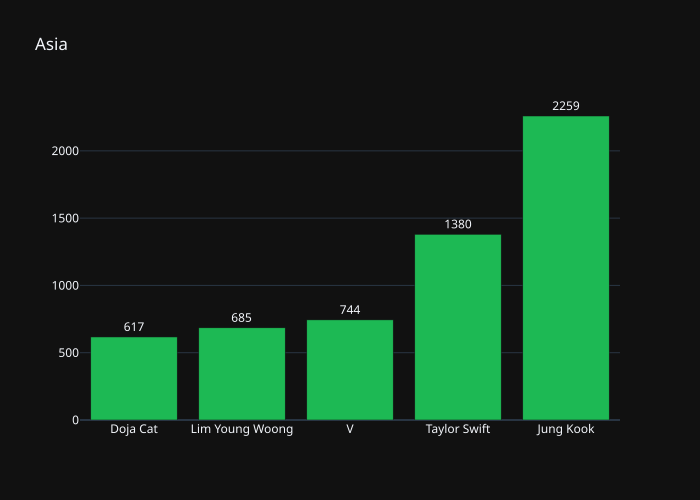

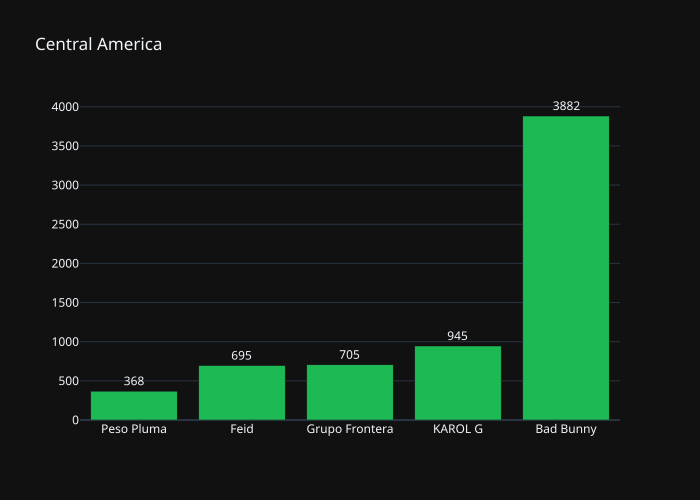

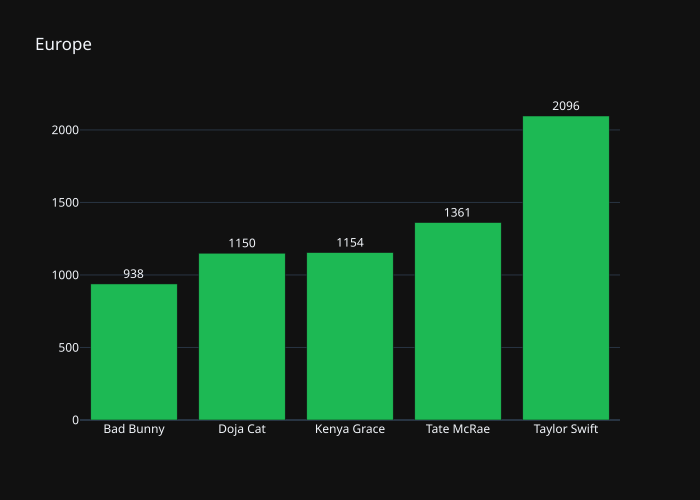

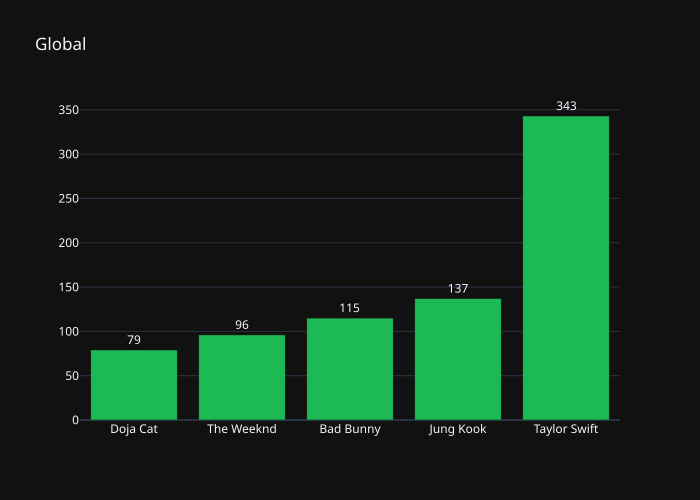

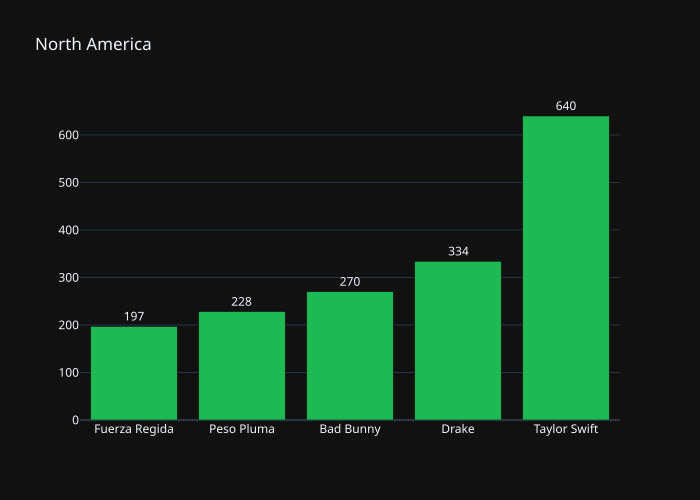

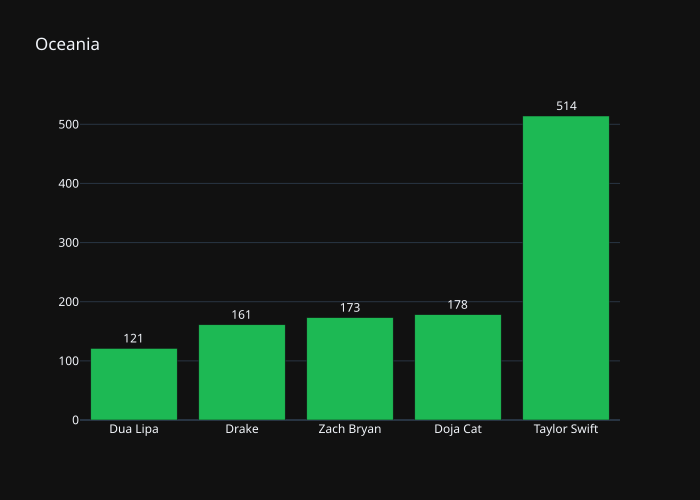

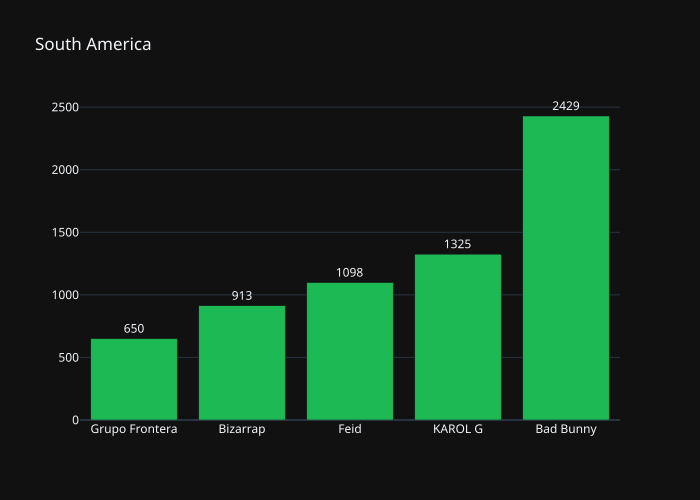

In [89]:
top_artists_by_continent = df.groupby(['continent', 'main_artist'])['main_artist'].count().reset_index(name='count')
top_artists_by_continent = top_artists_by_continent.sort_values(by=['continent', 'count'], ascending=[True, False])
top_artists_by_continent = top_artists_by_continent.groupby('continent').head(5)

continents_top= top_artists_by_continent['continent'].unique()


# Creating a loop to plot a bar chart for every continent
for i, continent in enumerate(continents_top):
    sub_df = top_artists_by_continent[top_artists_by_continent['continent'] == continent]  # Filtrar por la categoría actual
    fig = px.bar(sub_df, x='main_artist', y='count', title=continent, template='plotly_dark', height=500,
                 color_discrete_sequence=['#1DB954'], text='count')  # Crear un gráfico de barras
    fig.update_layout(title_text=continent, font = dict(size=12,family="Franklin Gothic"))  # Personalizar el título del gráfico

    
    fig.update_xaxes(title_text='', categoryorder='total ascending')
    fig.update_yaxes(title_text='')
    fig.update_traces(textposition='outside')

    fig.show('svg')

Bad Bunny is present in every continent but Asia and Ocenia.

Taylor Swift is highly popular in Asia, where Jung Kook rules.

Africa has quite different preferences when it comes to music.

In [54]:
keys_and_mode= df.groupby(['key', 'mode'])[['mode']].count().unstack().reset_index()
keys_and_mode

key   mode       
mode        0.0    1.0
0      A   5115   9665
1      B   8881   5407
2     Bb   5809   4134
3      C   3722   8671
4     C#   7226  13345
5      D   7587   8486
6      E   8492   2741
7     Eb   3387    947
8      F   8076   9125
9     F#  10829   4617
10     G   6591   7912
11    G#   4770   8227

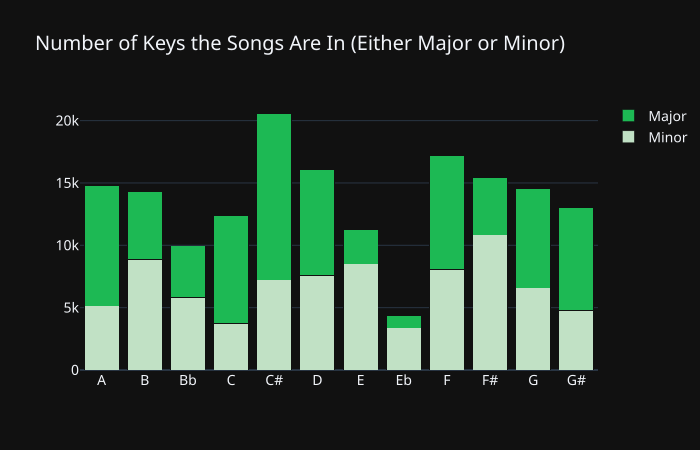

In [113]:
fig=go.Figure(data=[
    go.Bar(name='Minor', x=keys_and_mode['key'], y=keys_and_mode[('mode', 0.0)].values, marker_color='#C1E1C5'),
    go.Bar(name='Major', x=keys_and_mode['key'], y=keys_and_mode[('mode', 1.0)].values, marker_color='#1DB954')]).update_layout(
    barmode='stack',
    height=450,
    template='plotly_dark', font = dict(size=14,family="Franklin Gothic"),
    title='Number of Keys the Songs Are In (Either Major or Minor)' )
fig.show('svg')

We can't see a pattern in keys and modes. Only C# is preferred and Eb is not so popular for composers.

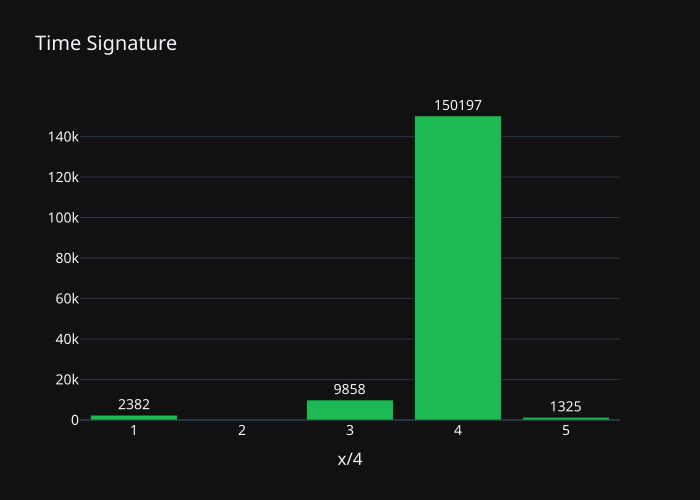

In [90]:
fig = px.bar(y= df['time_signature'].value_counts().sort_values(ascending=True).values, 
       x= df['time_signature'].value_counts().sort_values(ascending=True).index, 
       template= 'plotly_dark', 
       labels={'y': '', 'x': 'x/4'}, 
       height=500, text= df['time_signature'].value_counts().sort_values(ascending=True).values,
       color_discrete_sequence=['#1DB954'],
       title= 'Time Signature'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic")).update_traces(textposition='outside')
fig.show('svg')

As we may expect, 4/4 is the most common time signature. However, we can see there are songs in 5/4, which is unusual in popular music.

In [57]:
df['name'][df['time_signature']==5].unique()

array(['Ngimtholile', 'Can Dostum', 'Haegeum', 'Djurens vaggvisa',
       'Aktiv', "Let's Go 4", 'Baile do Bruxo', 'Khayaal', 'Tu Chacal',
       'Tu Buay', 'La Ruta', 'De Leven', 'Pidgin & English', '27',
       'WELD LAADOUL', 'Comforter (feat. Ayra Starr)', 'Ja sagen',
       'Эталон красоты', 'Allou', 'DEJA VU', 'PROSOPIKA FREESTYLE',
       'La Baby', 'Aleb Fel Dafater', 'Mala De Verdad (Tik Tak)',
       'Boy Boy', 'Onana', "Thank God It's Christmas - 2011 Remaster",
       'Tipo Hollywood', 'Fernando de Noronha', 'Ithuba',
       'Jestem Twoją Bajką', 'SĒNE!', 'Vem Quebrando', 'Somna',
       'Superstars', 'Red Button', 'Eu Sei ...', 'Pass me the light',
       'Ole (feat. BNXN)', 'People', 'Exxxonomy', 'Cuban Phonk',
       'PSYCHO (feat. MERO)', 'COMO ANTES', 'Oh My', 'LA FINE',
       'Akatsuki', 'Lambo (feat. VJ)', 'BRITNEY', 'DEFENDER',
       'My Brother', '6 BUSINESS DAYS (feat. Projexx)',
       'Roule un autre - A COLORS SHOW',
       'PICANTO (feat. Zlatan and ECko Mil

Above we can see the songs which are, according to the dataset, in 5/4.

In [58]:
df.loc[df['time_signature']==5].groupby(['time_signature', 'main_artist'])['main_artist'].count()

time_signature  main_artist    
5.0             Agust D            40
                Asme               32
                Bakr               45
                Balloranking        1
                Bella Shmurda      13
                Blaqbonez           1
                Bnxn               45
                Brytiago           43
                Bubbi Morthens      4
                Calcutta            1
                Capo                3
                Clicherik & Mäx     1
                DAVI               17
                DJ Louder           1
                Dj GBR             90
                Drake               4
                ElGrandeToto       38
                Emir Can İğrek     45
                Fireboy DML         4
                Haquil             45
                Hava               39
                Humlan Djojj       36
                Jazeek             41
                Jey One            42
                KEVIN ROLDAN        8
                Ke

And the artists as well.

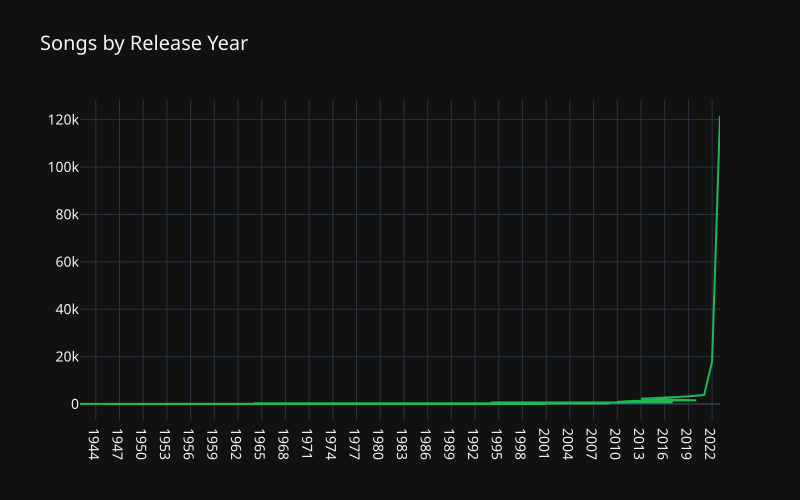

In [112]:
fig= px.line(y=df['release_year'].value_counts().values, 
        x=df['release_year'].value_counts().keys(),
        labels={'y': 'Number of songs', 'x':'Year'},
        template='plotly_dark',
        color_discrete_sequence=['#1DB954'],
        title='Songs by Release Year',
        width=800
       )
fig.update_xaxes(dtick=3, title_text='')
fig.update_yaxes(title_text='')
fig.update_layout(font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

In [60]:
df.query('release_year<=2021')['release_year'].value_counts().sort_index()

1942.0      46
1945.0       3
1957.0     268
1959.0     196
1962.0      48
1963.0     171
1964.0     278
1965.0      19
1967.0       1
1970.0      42
1971.0       1
1973.0       1
1974.0       2
1975.0       1
1976.0       1
1977.0     202
1979.0       2
1980.0      26
1981.0       1
1982.0      22
1983.0      36
1984.0      51
1985.0      28
1986.0       4
1987.0      25
1988.0     102
1989.0      10
1990.0       6
1991.0     108
1992.0       7
1993.0      80
1994.0     632
1995.0      21
1996.0       2
1997.0      51
1998.0      92
1999.0      45
2000.0      96
2001.0       3
2002.0     261
2003.0     256
2004.0     333
2005.0     289
2006.0     109
2007.0     337
2008.0     290
2009.0     199
2010.0     892
2011.0     571
2012.0    1296
2013.0    2222
2014.0    1450
2015.0     890
2016.0    1386
2017.0     643
2018.0    1505
2019.0    3202
2020.0    1557
2021.0    3836
Name: release_year, dtype: int64

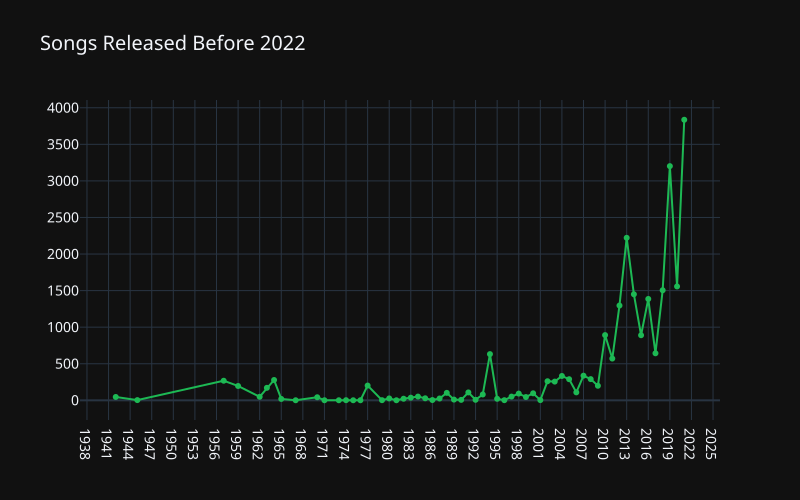

In [96]:
fig= px.line(y=df.query('release_year<=2021')['release_year'].value_counts().sort_index().values, 
        x=df.query('release_year<=2021')['release_year'].value_counts().sort_index().keys(),
        labels={'y': 'Number of songs', 'x':'Year'},
        template='plotly_dark',
        color_discrete_sequence=['#1DB954'],
        title='Songs Released Before 2022',
        width=800,
        markers=True
        
       )
fig.update_xaxes(dtick=3, title_text='')
fig.update_yaxes(title_text='')
fig.update_layout(font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

The rest of the songs were released between 1942 and 2023.

In [62]:
df.loc[(df['release_year']<2000)].groupby(['release_year','main_artist','name'])['name'].count().reset_index(name='count')

,release_year,main_artist,name,count
0,1942.0,Bing Crosby,White Christmas - 1947 Version,46
1,1945.0,Bing Crosby,Mele Kalikimaka (Merry Christmas),3
2,1957.0,Bobby Helms,Jingle Bell Rock,261
3,1957.0,Elvis Presley,Blue Christmas,7
4,1959.0,Dean Martin,Let It Snow! Let It Snow! Let It Snow!,192
...,...,...,...,...
86,1999.0,Red Hot Chili Peppers,Around the World,1
87,1999.0,Red Hot Chili Peppers,Californication,2
88,1999.0,Red Hot Chili Peppers,Otherside,2
89,1999.0,Red Hot Chili Peppers,Scar Tissue,2


Since it is Christmas time, seasonal songs appear, then, Red Hot Chili Peppers have songs from previous years.

In [63]:
df.loc[(df['main_artist'].isin(artists))].groupby(['main_artist', 'is_explicit'])['is_explicit'].count().reset_index(name='count')

,main_artist,is_explicit,count
0,Bad Bunny,0.0,17
1,Bad Bunny,1.0,8226
2,Doja Cat,1.0,2344
3,Drake,0.0,15
4,Drake,1.0,1677
5,Feid,0.0,785
6,Feid,1.0,1277
7,Jung Kook,0.0,1627
8,Jung Kook,1.0,2192
9,KAROL G,0.0,766


The 2 artists with most appearances have both, explicit and non-explicit songs. Bad Bunny has almost 100% explicit songs, while Taylor Swift 100% non-explicit songs

<Axes: >

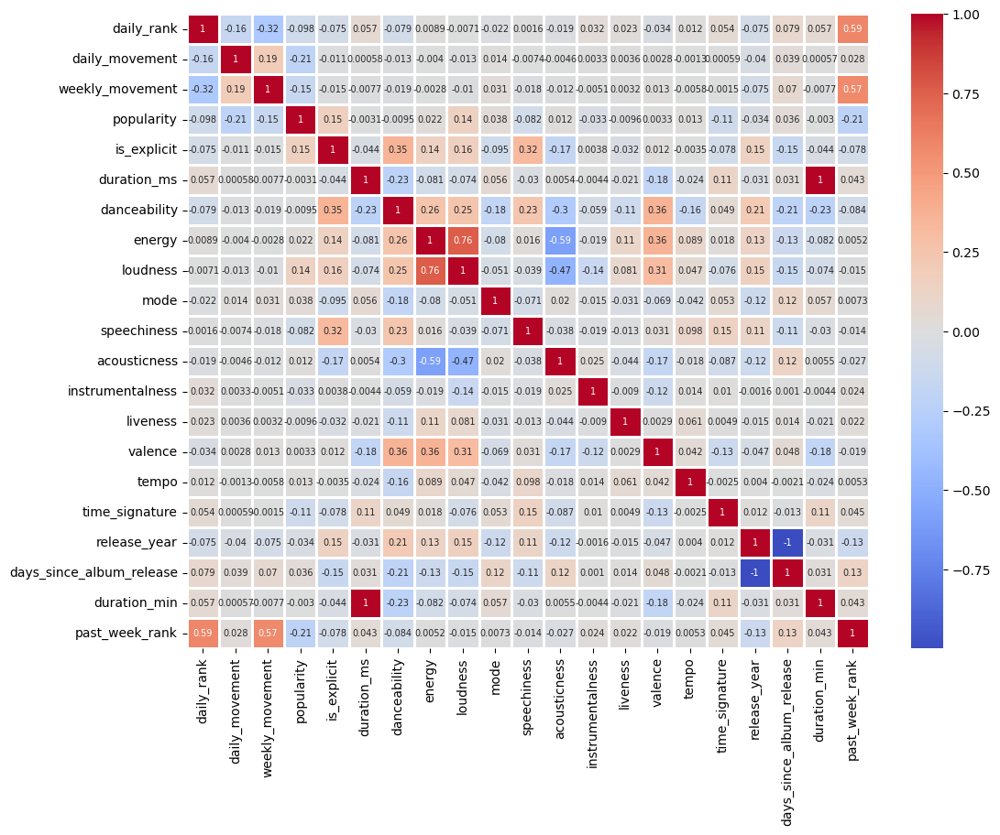

In [77]:
plt.figure(figsize=(12, 9))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm', 
            linewidths=1, annot_kws={'size': 7})


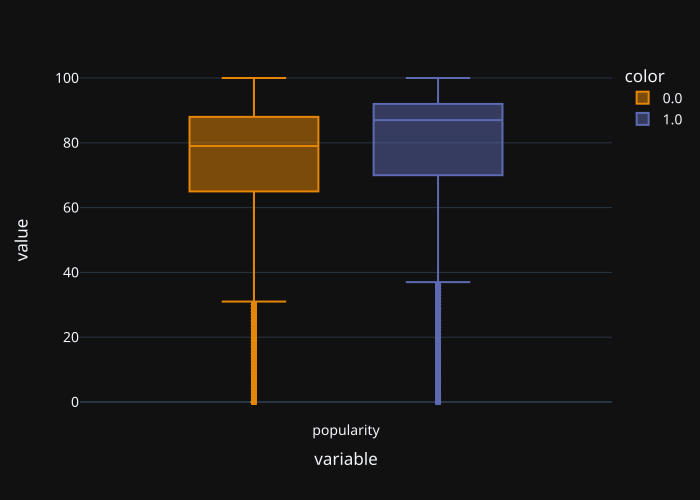

In [97]:
fig=px.box(df['popularity'], color=df['is_explicit'], template='plotly_dark', 
       color_discrete_sequence= px.colors.qualitative.Vivid).update_layout(
        font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

We can see that explicit songs are likely to be more popular. Nevertheless, being explicit is not the most important factor, as we saw with Taylor Swift music.

In [65]:
pointBiserialCorr = stats.pointbiserialr(x=df['is_explicit'], y=df['danceability'])
print(f"Point Biserial Correlation: {pointBiserialCorr}")

Point Biserial Correlation: SignificanceResult(statistic=0.3532428045122077, pvalue=0.0)


We used Point Biserial Correlation, since it is useful when comparing binomial and continuos variables.
We see a slight correlation and a significant pvalue.

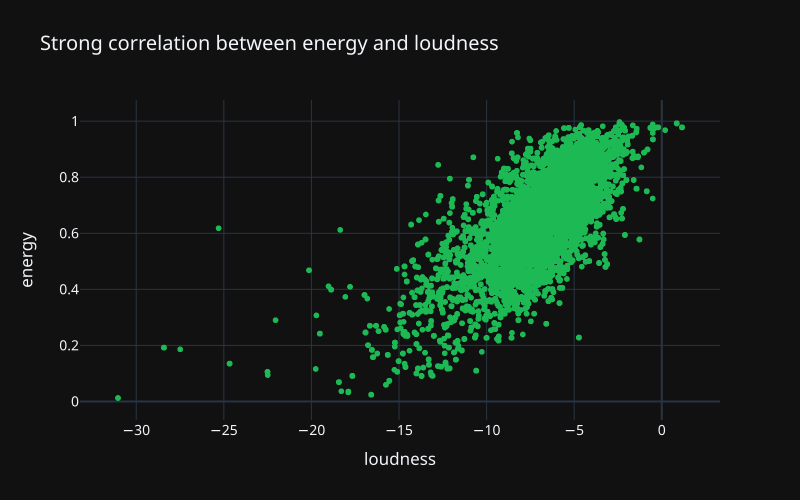

In [111]:
fig= px.scatter(df, x='loudness', y='energy', template='plotly_dark', width=800,
          color_discrete_sequence=['#1DB954'],
           title= 'Strong correlation between energy and loudness'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic"))
fig.show('png')

Loudness and energy share a relationship. This may seem obvious, louder music is more intense and conveys and energetic feeling. 

In [99]:
fig=px.box(df['weekly_movement'], template='plotly_dark', color_discrete_sequence=['#1DB954']).update_layout(
        font = dict(size=14,family="Franklin Gothic"))
fig.show('png')

50% of the values are between -19 and 1, and the next 50% between 1 and 24. Some outliers are present as well.


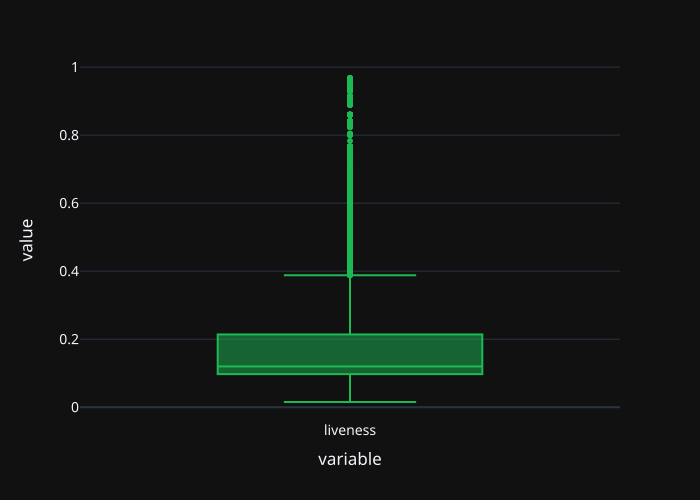

In [100]:
fig=px.box(df['liveness'], template='plotly_dark', color_discrete_sequence=['#1DB954']).update_layout(
        font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

In this section we see there is not likely to be presence of people during recordings.

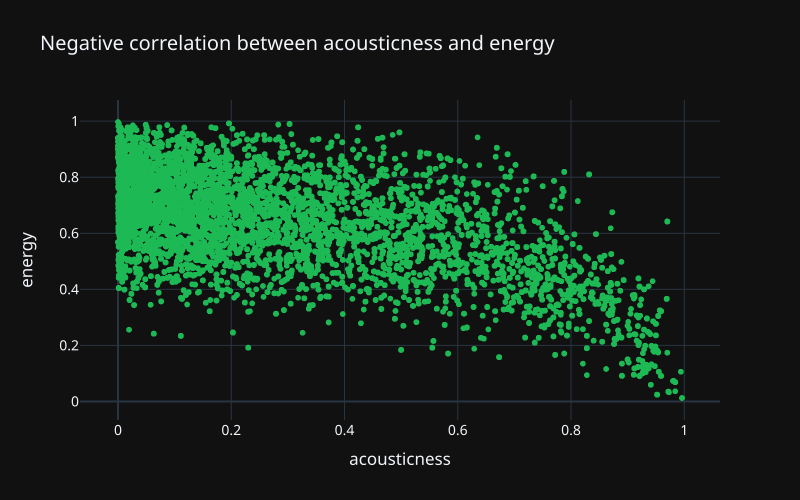

In [110]:
fig=px.scatter(df, x='acousticness', y='energy', template='plotly_dark', width=800,
          color_discrete_sequence=['#1DB954'],
           title= 'Negative correlation between acousticness and energy'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic"))
fig.show('png')

There  not much acoustic instruments in more energetic songs. This can be interpreted since most of the songs are made digitally and do not use real instruments, like acoustic guitars precisely. 

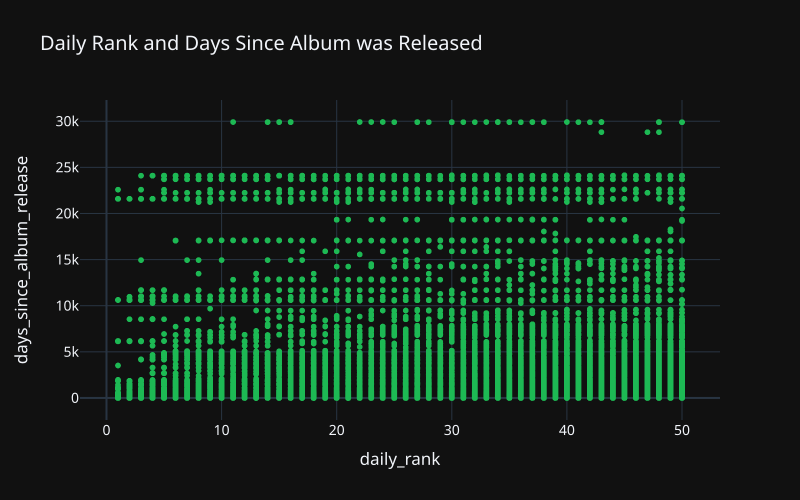

In [104]:
fig=px.scatter(df, x='daily_rank', y='days_since_album_release', template='plotly_dark', width=800,
          color_discrete_sequence=['#1DB954'],
           title= 'Daily Rank and Days Since Album was Released'
      ).update_layout(
        font = dict(size=14,family="Franklin Gothic"))
fig.show('png')

In [71]:
df[['name', 'release_year']][(df['daily_rank']==1) & (df['days_since_album_release']>=3000)]

,name,release_year
7550,Rockin' Around The Christmas Tree,1964.0
10950,All I Want for Christmas Is You,1994.0
11200,Rockin' Around The Christmas Tree,1964.0
14043,All I Want for Christmas Is You,1994.0
14093,Rockin' Around The Christmas Tree,1964.0
14843,Rockin' Around The Christmas Tree,1964.0
17493,All I Want for Christmas Is You,1994.0
17693,All I Want for Christmas Is You,1994.0
18493,Rockin' Around The Christmas Tree,1964.0
22593,This Is The Life,2007.0


Above are displayed songs with number 1 appearances and more than 3000 days since their release.

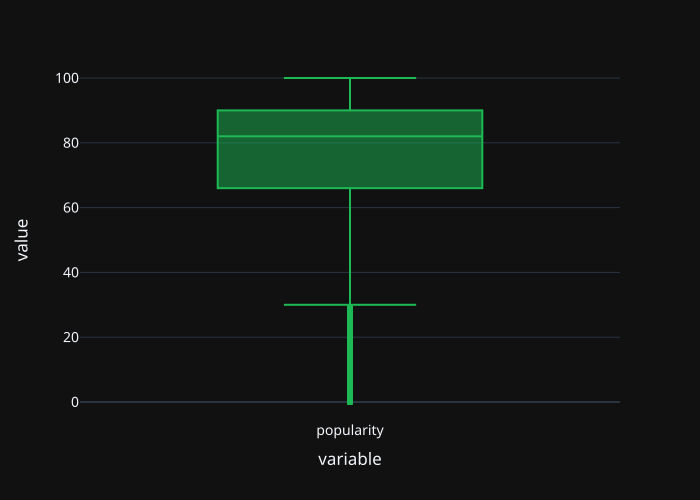

In [105]:
fig=px.box(df['popularity'], template='plotly_dark', color_discrete_sequence=['#1DB954']).update_layout(
        font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

As we saw earlier, there are songs with 0 of popularity and may be considered as outliers, up until a value of 29; according to the boxplot.

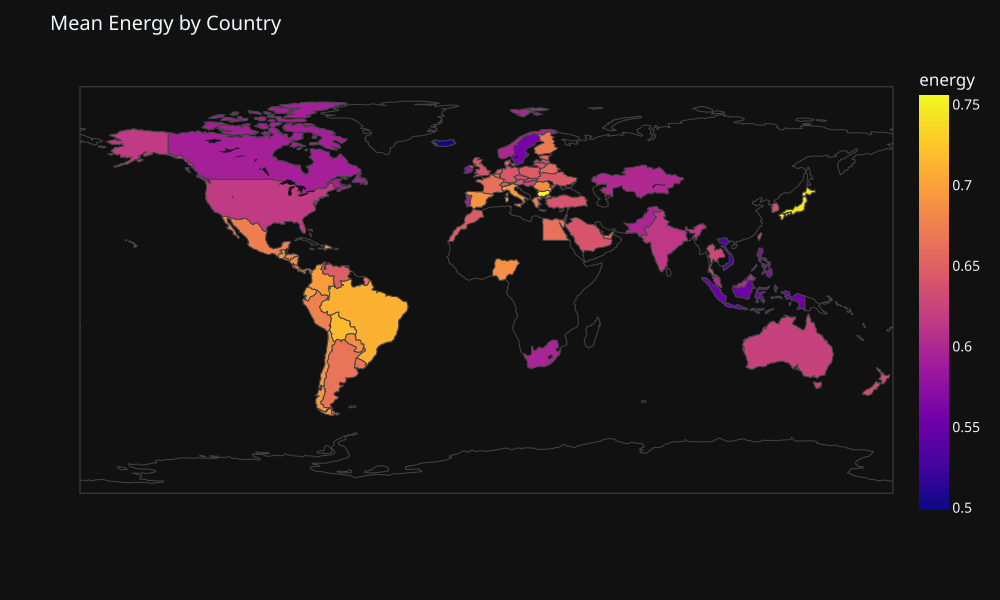

In [106]:
fig = px.choropleth(df.groupby(['country']).mean(numeric_only=True).reset_index(), locations='country', color='energy', 
              locationmode='country names', template='plotly_dark').update_layout(
                height=600, width=1000, title='Mean Energy by Country', font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

America seems to prefer more energetic music, along Japan and Bulgaria.

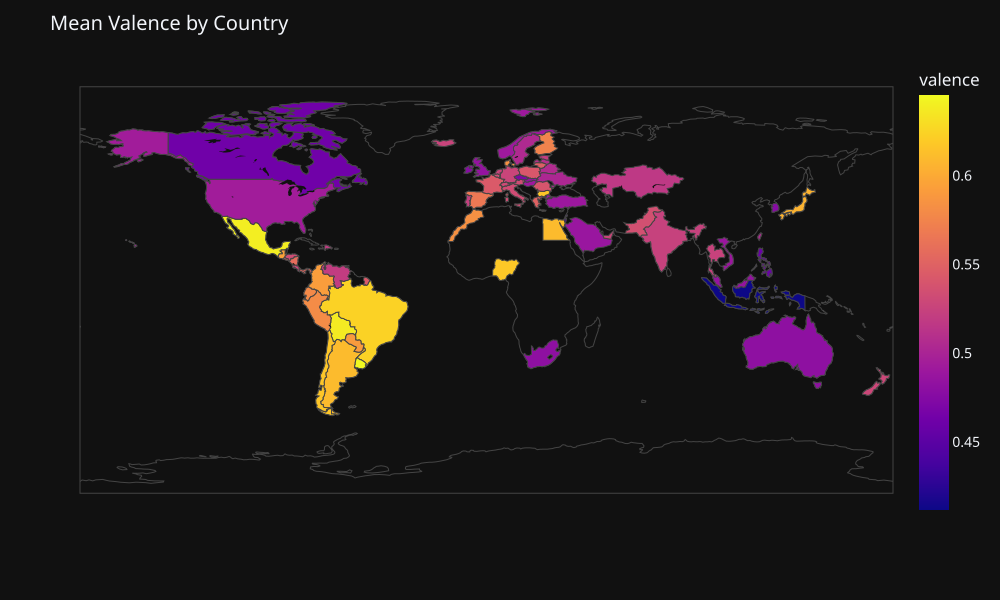

In [107]:
fig = px.choropleth(df.groupby(['country']).mean(numeric_only=True).reset_index(), locations='country', color='valence',
              locationmode='country names', template='plotly_dark').update_layout(
                height=600, width=1000, title= 'Mean Valence by Country', font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

Almost every country in South America prefers high valence in music, along Mexico.

North America and the rest of the world have mean values below 0.55. 

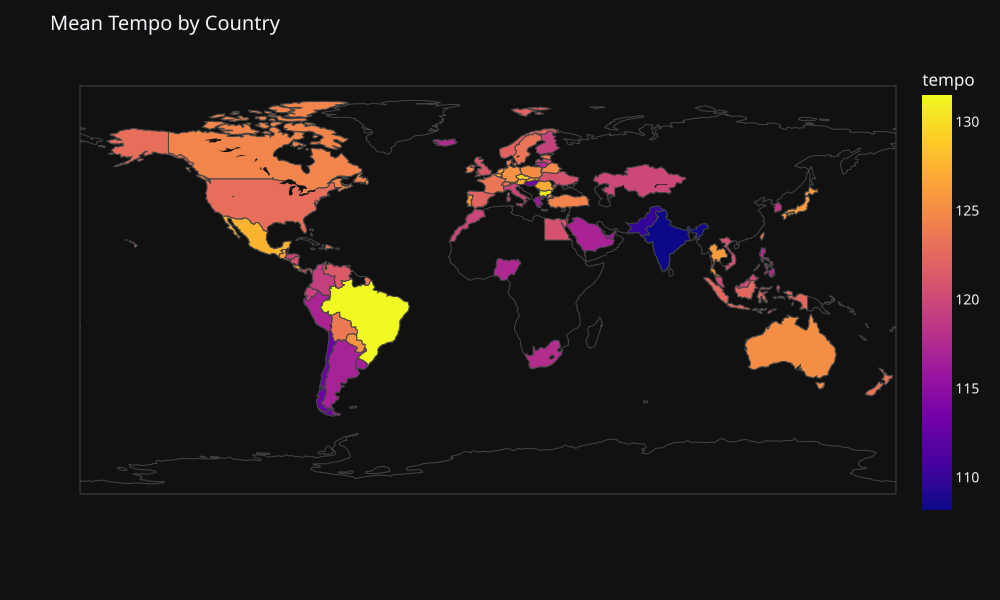

In [108]:
fig=px.choropleth(df.groupby(['country']).mean(numeric_only=True).reset_index(), locations='country', color='tempo',
              locationmode='country names', template='plotly_dark').update_layout(
                height=600, width=1000, title='Mean Tempo by Country', font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

This measure is a mixture of preferences.

Brazil has the highest mean in tempo and India the lowest.

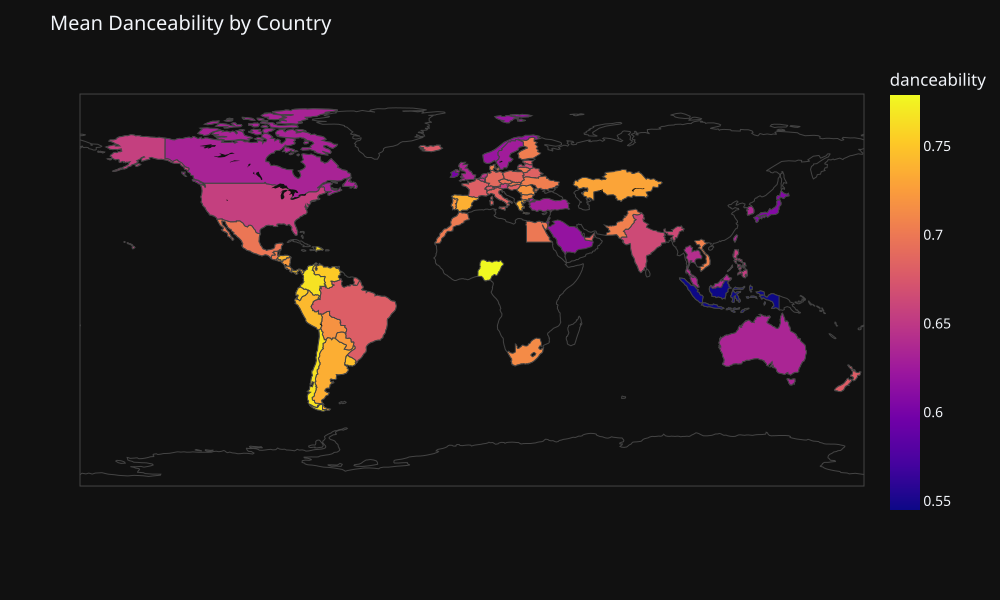

In [109]:
fig=px.choropleth(df.groupby(['country']).mean(numeric_only=True).reset_index(), locations='country', color='danceability',
              locationmode='country names', template='plotly_dark').update_layout(
                height=600, width=1000, title='Mean Danceability by Country', font = dict(size=14,family="Franklin Gothic"))
fig.show('svg')

Latin America, Africa and some countries in Europe prefer more danceable music.

## Final Thougts

**a)** Artists currently popular are heading Spotify daily ranks, which may be obvious. Other aspects are that there are songs which were released several years ago and continue to be present in today's mainstream. In addition, seasonality plays a key role, Christmas songs are being more streamed due to this fact.

**b)** Other aspects such as explicitness, energy, loudness, valence and more seem to have a major impact in preferences.

**c)** Africa is quite distinct when it comes to music taste, as well as Asia, but Bad Bunny and Taylor Swift make an impact across these continents as seen in the charts.

**d)** Most popular songs were released in the current year.

**e)** Popular music is most of the times in 4/4 time signature.

Other findings are listed below the charts. Feel free to take a look.